### isoda.py

d:\Kuliah\D4 - PENS\Semester 2\Visi Komputer\Tugas\Praktikum\.venv\lib\site-packages\sklearn\cluster\_kmeans.py:984: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)
d:\Kuliah\D4 - PENS\Semester 2\Visi Komputer\Tugas\Praktikum\.venv\lib\site-packages\sklearn\cluster\_kmeans.py:984: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)
d:\Kuliah\D4 - PENS\Semester 2\Visi Komputer\Tugas\Praktikum\.venv\lib\site-packages\sklearn\cluster\_kmeans.py:984: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  self._check_params(X)
d:\Kuliah\D4 - PENS\Semester 2\Visi Komputer\Tugas\Praktikum\.venv\lib\site-packages\sklearn\cluster\_kmeans.py:984: RuntimeWarning: Explicit initial center position passed: performing only one init in KMeans instead of n_init=10.
  se

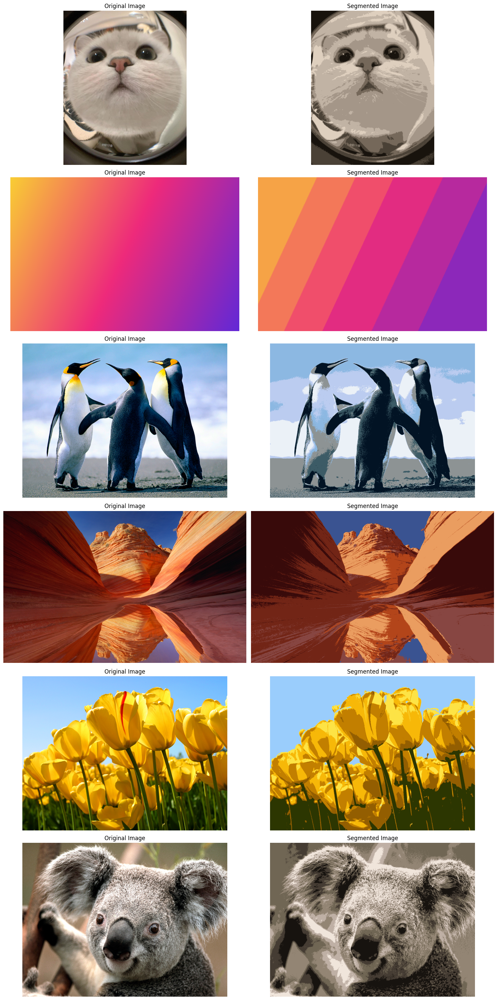

In [2]:
import numpy as np
import cv2
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# load image from images directory
images = [
    "../img/kucing.jpg",
    "../img/gradient.png",
    "../img/Penguins.jpg",
    "../img/arizona.jpg",
    "../img/Tulips.jpg",
    "../img/Koala.jpg",
]

# Set up the subplot grid
rows = len(images)
cols = 4

# Create a subplot for each image
fig, axes = plt.subplots(rows, 2, figsize=(15, 5 * rows))

# Loop through each image
for i, imgFilename in enumerate(images):
    # Membaca data Image
    oriImg = cv2.imread(imgFilename)

    # Display the original image
    axes[i, 0].imshow(cv2.cvtColor(oriImg, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title("Original Image")
    axes[i, 0].axis("off")

    # Membaca data Image
    img = cv2.imread(imgFilename)

    # Reshaping the image into a 2D array of pixels and 3 color values (RGB)
    pixels = img.reshape((-1, 3))  # numpy reshape operation -1 unspecified

    # Apply ISODATA clustering (K-Means with dynamic cluster adaptation)
    def isodata_clustering(data, max_clusters, min_samples=5, max_iter=100):
        kmeans = KMeans(n_clusters=max_clusters, random_state=42)
        kmeans.fit(data)
        labels = kmeans.labels_
        centers = kmeans.cluster_centers_

        for _ in range(max_iter):
            cluster_sizes = np.bincount(labels)
            mask = cluster_sizes > min_samples
            if mask.sum() == 0:
                break

            kmeans = KMeans(n_clusters=mask.sum(), random_state=42, init=centers[mask])
            kmeans.fit(data)
            labels = kmeans.labels_
            centers = kmeans.cluster_centers_

        return labels, centers

    # Apply ISODATA clustering
    num_clusters = 6  # Adjust the number of clusters as needed
    isodata_labels, isodata_centers = isodata_clustering(pixels, num_clusters)

    # Replace each pixel with its corresponding cluster center
    segmented_image = isodata_centers[isodata_labels].reshape(img.shape)

    titles = [
        "Segmented Image",
    ]

    segmented_image = [segmented_image]

    for j in range(len(titles)):
        # Display the image
        axes[i, j + 1].imshow(
            cv2.cvtColor(segmented_image[j].astype(np.uint8), cv2.COLOR_RGB2BGR),
        )
        axes[i, j + 1].set_title(f"{titles[j]}")
        axes[i, j + 1].axis("off")

# Show the plot
plt.tight_layout()
plt.show()

### levitation.py

In [4]:
# contoh simulasi
import pygame
import sys

pygame.init()
width, height = 400, 300
screen = pygame.display.set_mode((width, height))
bg_color = (0, 162, 92)
x, y = width // 2, height // 2
object_radius = 20
x_speed, y_speed = 1, 1
while True:
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            pygame.quit()
            sys.exit()
    x += x_speed
    y += y_speed
    screen.fill(bg_color)
    pygame.draw.circle(screen, (0, 0, 0), (x, y), object_radius)
    pygame.display.flip()
    pygame.time.delay(10)


SystemExit: 

### menghe.py

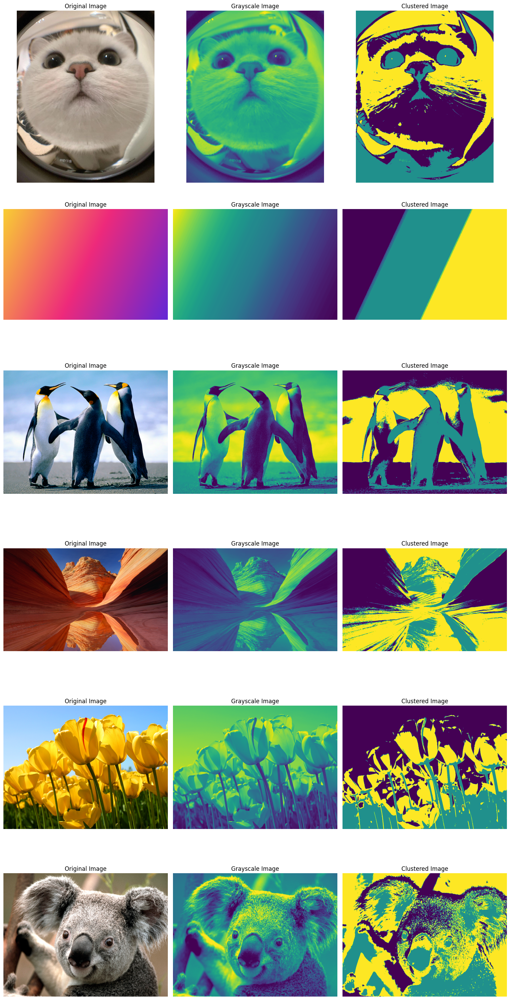

In [5]:
import cv2
import numpy as np
from sklearn.cluster import KMeans
from skimage import feature
import matplotlib.pyplot as plt

# load image from images directory
images = [
    "../img/kucing.jpg",
    "../img/gradient.png",
    "../img/Penguins.jpg",
    "../img/arizona.jpg",
    "../img/Tulips.jpg",
    "../img/Koala.jpg",
]

# Set up the subplot grid
rows = len(images)
cols = 4

# Create a subplot for each image
fig, axes = plt.subplots(rows, 3, figsize=(15, 5 * rows))

# Loop through each image
for i, imgFilename in enumerate(images):
    # Membaca data Image
    oriImg = cv2.imread(imgFilename)

    # Display the original image
    axes[i, 0].imshow(cv2.cvtColor(oriImg, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title("Original Image")
    axes[i, 0].axis("off")

    # Membaca data Image
    img = cv2.imread(imgFilename, 0)

    # Extract Local Binary Pattern (LBP) features
    radius = 3
    n_points = 8 * radius
    lbp_features = feature.local_binary_pattern(img, n_points, radius, method="uniform")

    # Reshape the LBP features to a 1D array
    lbp_features_1d = lbp_features.flatten()

    # Reshape the image to a 1D array for clustering
    image_1d = img.flatten()

    # Concatenate LBP features with pixel values
    data = np.column_stack((image_1d, lbp_features_1d))

    # Apply K-Means clustering
    num_clusters = 3  # Adjust the number of clusters as needed
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    labels = kmeans.fit_predict(data)

    # Reshape the labels to the shape of the original image
    clustered_image = labels.reshape(img.shape)

    titles = [
        "Grayscale Image",
        "Clustered Image",
    ]

    clustered_image = [img, clustered_image]

    for j in range(len(titles)):
        # Display the image
        axes[i, j + 1].imshow(clustered_image[j], cmap="viridis")
        axes[i, j + 1].set_title(f"{titles[j]}")
        axes[i, j + 1].axis("off")

# Show the plot
plt.tight_layout()
plt.show()

### region.py

In [6]:
import cv2
import itertools
import numpy as np
import random
import sys

# class for a stack
class Stack:
    def __init__(self):
        self.item = []
        self.obj = []

    def push(self, value):
        self.item.append(value)

    def pop(self):
        return self.item.pop()

    def size(self):
        return len(self.item)

    def isEmpty(self):
        return self.size() == 0

    def clear(self):
        self.item = []

class regionGrow:

    def __init__(self, im_path, th):
        self.readImage(im_path)
        self.h, self.w, _ = self.im.shape
        self.passedBy = np.zeros((self.h, self.w), np.double)
        self.currentRegion = 0
        self.iterations = 0
        self.SEGS = np.zeros((self.h, self.w, 3), dtype="uint8")
        self.stack = Stack()
        self.thresh = float(th)

    def readImage(self, img_path):
        self.im = cv2.imread(img_path, 1).astype("int")

    def getNeighbour(self, x0, y0):
        return [
            (x, y)
            for i, j in itertools.product((-1, 0, 1), repeat=2)
            if (i, j) != (0, 0) and self.boundaries(x := x0 + i, y := y0 + j)
        ]

    def create_seeds(self):
        return [
            [self.h / 2, self.w / 2],
            [self.h / 3, self.w / 3],
            [2 * self.h / 3, self.w / 3],
            [self.h / 3 - 10, self.w / 3],
            [self.h / 3, 2 * self.w / 3],
            [2 * self.h / 3, 2 * self.w / 3],
            [self.h / 3 - 10, 2 * self.w / 3],
            [self.h / 3, self.w - 10],
            [2 * self.h / 3, self.w - 10],
            [self.h / 3 - 10, self.w - 10],
        ]

    def ApplyRegionGrow(self, cv_display=True):

        randomseeds = self.create_seeds()
        np.random.shuffle(randomseeds)

        for x0 in range(self.h):
            for y0 in range(self.w):

                if self.passedBy[x0, y0] == 0:  # and (np.all(self.im[x0,y0] > 0)) :
                    self.currentRegion += 1
                    self.passedBy[x0, y0] = self.currentRegion
                    self.stack.push((x0, y0))
                    self.prev_region_count = 0

                    while not self.stack.isEmpty():
                        x, y = self.stack.pop()
                        self.BFS(x, y)
                        self.iterations += 1

                    if self.PassedAll():
                        break

                    if self.prev_region_count < 8 * 8:
                        x0, y0 = self.reset_region(x0, y0)

        if self.iterations > 200000:
            print("Max Iterations")
        print(f"Iterations : {str(self.iterations)}")

        if cv_display:
            [
                self.color_pixel(i, j)
                for i, j in itertools.product(range(self.h), range(self.w))
            ]
            self.display()

    def reset_region(self, x0, y0):

        self.passedBy[self.passedBy == self.currentRegion] = 0
        x0 = random.randint(x0 - 4, x0 + 4)
        y0 = random.randint(y0 - 4, y0 + 4)
        x0 = np.clip(x0, 0, self.h - 1)
        y0 = np.clip(y0, 0, self.w - 1)
        self.currentRegion -= 1
        return x0, y0

    def color_pixel(self, i, j):
        val = self.passedBy[i][j]
        self.SEGS[i][j] = (
            (255, 255, 255) if (val == 0) else (val * 35, val * 90, val * 30)
        )

    def display(self):
        cv2.imshow("", self.SEGS)
        cv2.waitKey(0)
        cv2.destroyAllWindows()

    def BFS(self, x0, y0):

        regionNum = self.passedBy[x0, y0]

        elems = [np.mean(self.im[x0, y0])]

        var = self.thresh

        neighbours = self.getNeighbour(x0, y0)

        for x, y in neighbours:
            if self.passedBy[x, y] == 0 and self.distance(x, y, x0, y0) < var:

                if self.PassedAll():
                    break

                self.passedBy[x, y] = regionNum
                self.stack.push((x, y))
                elems.append(np.mean(self.im[x, y]))
                var = np.var(elems)
                self.prev_region_count += 1
            var = max(var, self.thresh)

    def PassedAll(self, max_iteration=200000):

        return self.iterations > max_iteration or np.all(self.passedBy > 0)

    def boundaries(self, x, y):
        return 0 <= x < self.h and 0 <= y < self.w

    def distance(self, x, y, x0, y0):

        return np.linalg.norm(self.im[x0, y0] - self.im[x, y])

# List of images
images = [
    "../img/kucing.jpg",
    "../img/gradient.png",
    "../img/Penguins.jpg",
    "../img/arizona.jpg",
    "../img/Tulips.jpg",
    "../img/Koala.jpg",
]

threshold_value = 0.7  # Adjust the threshold value as needed

# Apply region growing for each image
for img_path in images:
    exemple = regionGrow(img_path, threshold_value)
    exemple.ApplyRegionGrow()

Max Iterations
Iterations : 201782
Max Iterations
Iterations : 201798
Max Iterations
Iterations : 200670
Max Iterations
Iterations : 201142
Max Iterations
Iterations : 200673
Max Iterations
Iterations : 200613
